# Sel Identitas (Wajib Menjadi Sel Pertama)

In [ ]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo
NAMA = 'Nabhan Rizqi Julian Saputro'
NIM = '2341720255' # ganti dengan NIM Anda
N = int(NIM[-3:])
PARAM = {
 'b' : (N % 61) + 20,
 'a' : round(1.0 + (N % 9) / 10, 1),
 'c' : (N % 20) + 30,
 'gamma': round(0.4 + (N % 6) * 0.25, 2),
 'bit' : (N % 6) + 2,
}
waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))
print('NAMA :', NAMA)
print('NIM :', NIM, '| N =', N)
for k, v in PARAM.items():
 print('%-6s :' % k, v)
print('WAKTU :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())
kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA : Nabhan Rizqi Julian Saputro
NIM : 2341720255 | N = 255
b      : 31
a      : 1.3
c      : 45
gamma  : 1.15
bit    : 5
WAKTU : 2026-09-13 13:34:51 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN : aff672e779581f42


# Transformasi Linier Brightness- Transformasi Linier Brightness

> Formula: g(x,y)=f(x,y)+b

g(x,y) adalah nilai pixel setelah transformasi, f(x,y) adalah nilai pixel asli, b adalah nilai brightness

 Mengubah tingkat kecerahan citra
---------------------------------
Masukkan nilai kecerahan: 30


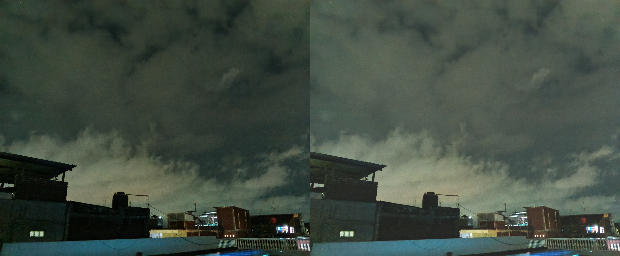

In [75]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra')
print('---------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/NIGHT1.jpg')
# Resize original ke (310, 256)
original = cv.resize(original, (310, 256))

brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
# for y in range(original.shape[0]):
#   for x in range(original.shape[1]):
#     for c in range(original.shape[2]):
#       brightness_image[y,x,c] = np.clip(original [y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
brightness_image = cv.convertScaleAbs(original, beta=brightness) #-Transformasi Linier Brightness

#Cara simple tanpa for loopp
#brigntness_imaage = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat ((original, brightness_image))
cv2_imshow(final_frame)

## TUGAS PRAKTIKUM

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula pada
bagian Ulasan Teori. Terapkan pada KTM1b.jpg dan KTM1a.jpg, tampilkan
berdampingan dengan citra aslinya. Jelaskan mengapa citra negatif dari KTM1a
(ruangan gelap) tampak pucat dan berkabut, sedangkan negatif dari KTM1b tetap
kontras.

Rumus Invers =
> g(x,y) = 255 - f(x,y)

dengan f(x,y) = citra asli



[2341720255] KTM1a: Asli (Kiri) vs Negatif (Kanan)


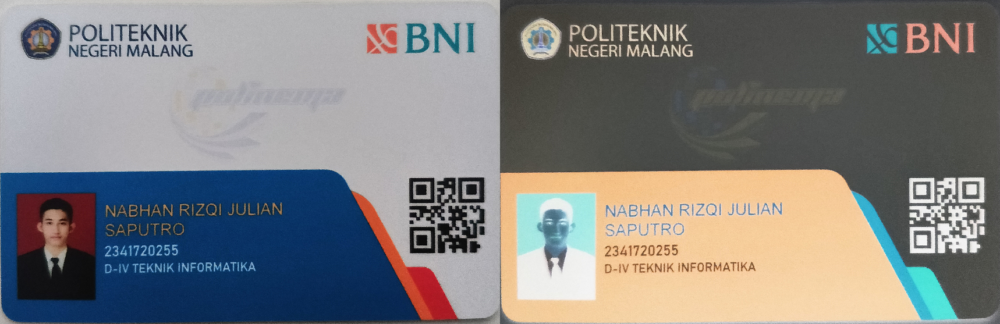

[2341720255] KTM1b: Asli (Kiri) vs Negatif (Kanan)


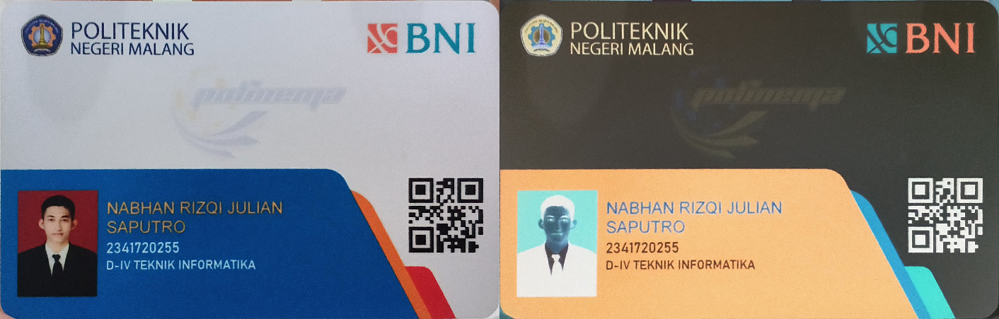

In [78]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

BASE_PATH = f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/'

img_a = cv.imread(BASE_PATH + 'KTM1a.jpg')
img_b = cv.imread(BASE_PATH + 'KTM1b.jpg')

# Resize images to 30% dari gambar asli agar tidak lama rendernya
img_a = cv.resize(img_a, (0, 0), fx=0.3, fy=0.3)
img_b = cv.resize(img_b, (0, 0), fx=0.3, fy=0.3)

inv_a = (255 - img_a)
inv_b = (255 - img_b)

hasil_a = cv.hconcat([img_a, inv_a])
hasil_b = cv.hconcat([img_b, inv_b])

print(f"[{NIM}] KTM1a: Asli (Kiri) vs Negatif (Kanan)")
cv2_imshow(hasil_a)

print(f"[{NIM}] KTM1b: Asli (Kiri) vs Negatif (Kanan)")
cv2_imshow(hasil_b)

2. Implementasikan transformasi kontras dengan nilai a yang dihitung dari NIM Anda (PARAM['a']) pada KTM1a.jpg.

Mengubah kontras dan tingkat kecerahan citra
-------------------------------------------
Masukkan tingkat kecerahan: 30
Nilai kontras otomatis dari NIM (PARAM['a']): 1.3
Hasil [2341720255] - Kiri: Asli | Kanan: Kontras 1.3 & Brightness 30


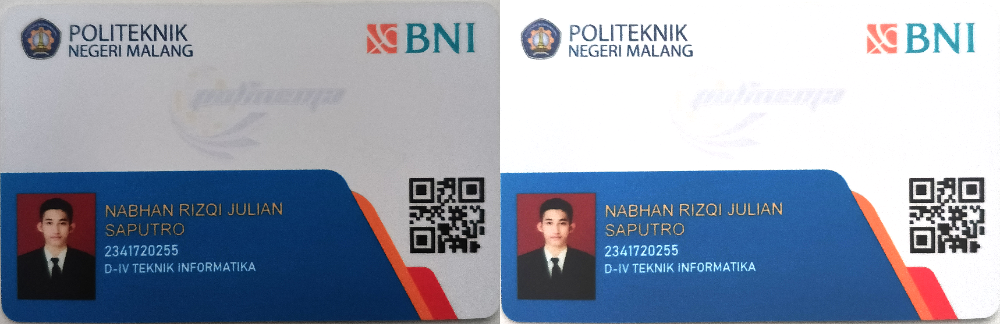

In [79]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('-------------------------------------------')

try:
    brightness = int(input('Masukkan tingkat kecerahan: '))
except ValueError:
    print('Error, not a number')

# Kontras diambil langsung dari sel identitas modul (PARAM['a'])
contrast = PARAM['a']
print(f"Nilai kontras otomatis dari NIM (PARAM['a']): {contrast}")

# 1. Baca citra
original = cv.imread(f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/KTM1a.jpg')
# Resize images to 30% dari gambar asli agar tidak lama rendernya
original = cv.resize(original, (0, 0), fx=0.3, fy=0.3)

# 2. Terapkan transformasi: g(x,y) = contrast * f(x,y) + brightness
# cv.convertScaleAbs otomatis memotong nilai piksel agar aman di rentang 0-255 (truncate)
contrast_image = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)

# 3. Tampilkan hasil berdampingan dengan label NIM
final_frame = cv.hconcat([original, contrast_image])
print(f"Hasil [{NIM}] - Kiri: Asli | Kanan: Kontras {contrast} & Brightness {brightness}")
cv2_imshow(final_frame)

3. Implementasikan transformasi logarithmic brightness dengan konstanta c hasil hitung
dari NIM (PARAM['c']) pada KTM1a.jpg. Bandingkan hasilnya dengan linier brightness memakai nilai b hasil hitung dari NIM (PARAM['b']) pada citra yang sama. Tentukan metode mana yang membuat NIM pada kartu Anda lebih terbaca, dan tunjukkan bagian mana yang menjadi putih penuh (clipping) pada masing-masing metode.

[2341720255] Kiri: Asli | Tengah: Log (c=45) | Kanan: Linier (b=31)


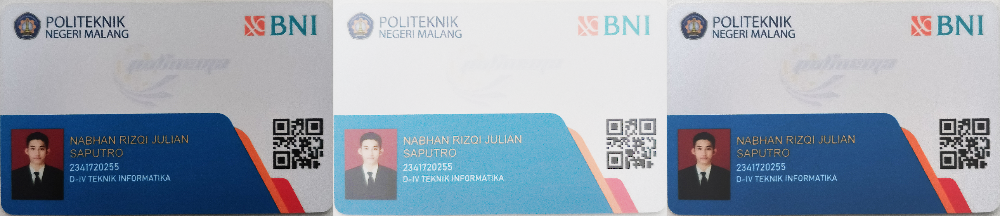

In [80]:
#1. Ambil parameter dari sel identitas (NIM)
c = PARAM['c']
b = PARAM['b']

#2
path = f"/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/KTM1a.jpg"
original = cv.imread(path)
# Resize images to 30% dari gambar asli agar tidak lama rendernya
original = cv.resize(original, (0, 0), fx=0.3, fy=0.3)

# 3. Transformasi Logarithmic Brightness: s = c * log(1 + r)
# original diubah ke float64 agar perhitungan log presisi
log_trans = c * np.log(1.0 + original.astype(np.float64))
log_image = np.clip(log_trans, 0, 255).astype(np.uint8)

# 4. Transformasi Linier Brightness: g(x,y) = f(x,y) + b
# Menggunakan cv.add agar nilai di atas 255 otomatis tersaturasi (clipping)
# linier_image = cv.add(original, np.full(original.shape, b, dtype=np.uint8))
linier_image = cv.convertScaleAbs(original, beta=brightness)

# 5. Gabungkan dan tampilkan perbandingan
hasil = cv.hconcat([original, log_image, linier_image])
print(f"[{NIM}] Kiri: Asli | Tengah: Log (c={c}) | Kanan: Linier (b={b})")
cv2_imshow(hasil)

4. Implementasikan transformasi grayscale metode averaging, lightness, dan luminance
pada KTM1c.jpg, yaitu citra yang diambil dengan flash. Hitung rata-rata dan
simpangan baku intensitas hasil ketiga metode, sajikan dalam satu tabel, lalu tentukan
metode mana yang memberi pemisahan paling jelas antara teks dan latar kartu.


[2341720255] Grayscale: Averaging (Kiri) | Lightness (Tengah) | Luminance (Kanan)


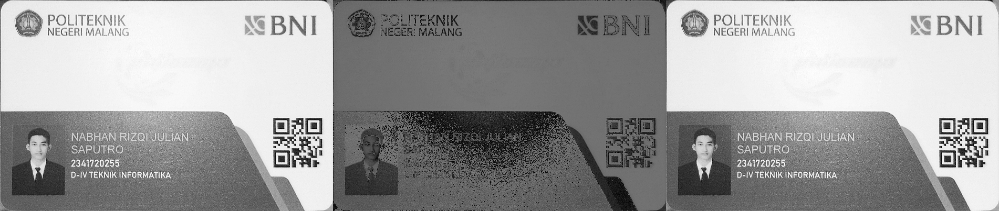


Metode		Mean		Std Dev
----------------------------------------
Averaging	188.00		65.22
Lightness	96.58		31.74
Luminance	186.40		67.07


In [81]:
# import cv2 as cv
# import numpy as np
import matplotlib.pyplot as plt

# 1
path = f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/KTM1c.jpg'
img = cv.imread(path)
# Resize images to 30% dari gambar asli agar tidak lama rendernya
img = cv.resize(img, (0, 0), fx=0.3, fy=0.3)

# 2. Pecah channel langsung dengan fungsi cv.split()
b, g, r = cv.split(img)

# 3. Hitung masing-masing metode sesuai rumus modul
# a. Averaging
gray_avg = ((r.astype(int) + g.astype(int) + b.astype(int)) / 3).astype(np.uint8)

# b. Lightness: (max + min) / 2
gray_light = ((np.maximum.reduce([r, g, b]) + np.minimum.reduce([r, g, b])) / 2).astype(np.uint8)

# c. Luminance: 0.21*R + 0.72*G + 0.07*B
gray_lum = (0.21 * r + 0.72 * g + 0.07 * b).astype(np.uint8)

# 4. Tampilkan berdampingan dengan cv2_imshow (gaya sederhana modul)
from google.colab.patches import cv2_imshow

print(f"[{NIM}] Grayscale: Averaging (Kiri) | Lightness (Tengah) | Luminance (Kanan)")
cv2_imshow(cv.hconcat([gray_avg, gray_light, gray_lum]))

# 5. Tabel nilai Rata-rata dan Simpangan Baku
print("\nMetode\t\tMean\t\tStd Dev")
print("-" * 40)
print(f"Averaging\t{gray_avg.mean():.2f}\t\t{gray_avg.std():.2f}")
print(f"Lightness\t{gray_light.mean():.2f}\t\t{gray_light.std():.2f}")
print(f"Luminance\t{gray_lum.mean():.2f}\t\t{gray_lum.std():.2f}")

5. Tampilkan satu warna tertentu pada citra dan ubah bagian lainnya menjadi grayscale.
Gunakan OBJ1.jpg, yaitu foto benda milik Anda sendiri dengan satu warna dominan.
Sebutkan rentang nilai HSV yang Anda pakai sebagai batas warna, lalu tunjukkan
pengaruhnya apabila rentang tersebut diperlebar dan dipersempit.

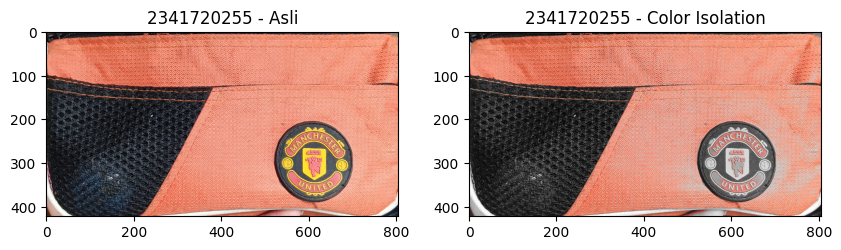

In [82]:
# Baca gambar dan buat versi grayscale
img = cv.imread(f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/OBJ1.jpg')
# Resize images to 30% dari gambar asli agar tidak lama rendernya
img = cv.resize(img, (0, 0), fx=0.3, fy=0.3)

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)  # Ubah ke 3 channel agar bisa ditambah

# Cari warna objek pakai HSV (contoh rentang MERAH) jadi akan mengambil warna merah
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

lower_red = np.array([0, 100, 100]) #rentaang merah 0-10 dan 170-180
upper_red = np.array([10, 255, 255])
mask = cv.inRange(hsv, lower_red, upper_red)
#cara baca
# H: 0 sampai 10 (zona merah)
# S: 100 sampai 255 (ambil yang warnanya cukup pekat, abaikan putih/abu)
# V: 100 sampai 255 (ambil yang cukup terang, abaikan hitam)


# Pisahkan bagian warna dan bagian abu-abu memakai Bitwise
objek_berwarna = cv.bitwise_and(img, img, mask=mask)
latar_abu = cv.bitwise_and(gray_bgr, gray_bgr, mask=cv.bitwise_not(mask))

# Satukan keduanya
hasil = cv.add(objek_berwarna, latar_abu)

# Tampilkan (konversi ke RGB untuk Matplotlib)
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title(f"{NIM} - Asli")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
plt.title(f"{NIM} - Color Isolation")
plt.show()

6. Nilai gamma diminta dari pengguna melalui kode di bawah ini. Lanjutkan kode tersebut
sesuai rumus pada Ulasan Teori, kemudian terapkan pada KTM1a.jpg. Mulailah dari nilai
gamma hasil hitung dari NIM Anda, lalu cari secara bertahap nilai gamma yang membuat
NIM dan nama pada kartu paling terbaca. Tampilkan minimal lima nilai gamma yang
dicoba beserta hasilnya, sebutkan nilai gamma terbaik pilihan Anda, dan jelaskan
mengapa nilai terbaik setiap mahasiswa berbeda meskipun jenis objeknya sama.

In [ ]:
path = f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/KTM1a.jpg'
img = cv.imread(path)
# Resize images to 30% dari gambar asli agar tidak lama rendernya
img = cv.resize(img, (0, 0), fx=0.3, fy=0.3)

# Ambil nilai gamma dari input (atau langsung pakai PARAM['gamma'])
daftar_gamma = [0.4, 0.7, PARAM['gamma'], 0.9, 2.0]

for gm in daftar_gamma:
  print('Gamma Correction pada citra')
  print('---------------------------')
  # try:
  #     gamma = float(input('Masukkan nilai Gamma: '))
  # except ValueError:
  #     print('Error, not a number')

  # Hitung langsung rumusnya dalam 1 baris
  # Normalisasi ke 0-1, pangkatkan gamma, kalikan 255
  gamma_img = np.array(255 * (img / 255.0) ** gm, dtype=np.uint8)

  # Tampilkan (Asli vs Gamma)
  hasil = cv.hconcat([img, gamma_img])
  print(f"[{NIM}] Kiri: Asli | Kanan: Gamma ({gm})")
  cv2_imshow(hasil)


Menurutku nilai gamma terbaik adalaah  0.9 karenaa tidak terlalu terang maupun gelap. Dan mengapa setiap mahasiswa berbeda meskipun jenis objeknya sama? ya karena pengambilan gambarnya pasti berbeda untuk setiap mahasiswa.

7. Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi
citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit).
Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0
(000 0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit.
Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst.
Kuantisasi KTM1b.jpg pada kedalaman 1 sampai 7 bit dan tampilkan seluruh hasilnya.
Tentukan pada kedalaman berapa nama dan NIM pada kartu Anda masih terbaca,

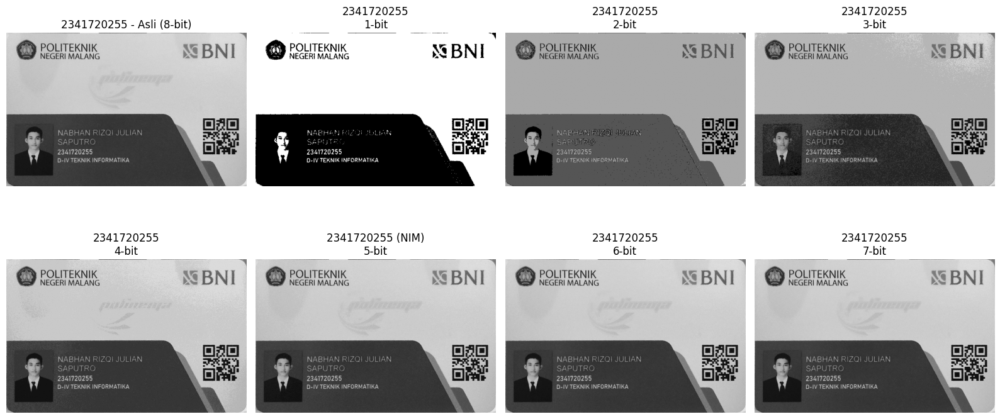

In [83]:
# 1. Baca citra KTM1b dalam bentuk grayscale
path = f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/KTM1b.jpg'
original = cv.imread(path, cv.IMREAD_GRAYSCALE)
# Resize images to 30% dari gambar asli agar tidak lama rendernya
original = cv.resize(original, (0, 0), fx=0.3, fy=0.3)

# 2. Siapkan frame plot untuk 8 gambar (1 asli + 7 variasi bit)
plt.figure(figsize=(16, 8))

# Tampilkan citra asli (8-bit)
plt.subplot(2, 4, 1)
plt.imshow(original, cmap='gray')
plt.title(f"{NIM} - Asli (8-bit)")
plt.axis('off')

# 3. Loop kuantisasi dari 1-bit sampai 7-bit sesuai rumus modul
for bit in range(1, 8):
    level = 255.0 / (pow(2, bit) - 1)
    depth_image = np.round(original / level) * level
    depth_image = depth_image.astype(np.uint8)

    # Plot tiap kedalaman bit
    plt.subplot(2, 4, bit + 1)
    plt.imshow(depth_image, cmap='gray')
    label = f"{NIM} (NIM)\n{bit}-bit" if bit == PARAM['bit'] else f"{NIM}\n{bit}-bit"
    plt.title(label)
    plt.axis('off')

plt.tight_layout()
plt.show()

Pada rentang 3-8 bit mudah terbaca, untuk 1-2 sulit terbaca karena adanya adanya campuran warna yang tak terbaca

No   | Jumlah Citra    | Nilai PSNR (dB)
----------------------------------------
1    | 10              | 19.37 dB
[2341720255] Hasil Average 10 Citra:


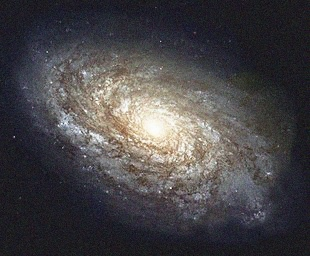

2    | 20              | 19.47 dB
[2341720255] Hasil Average 20 Citra:


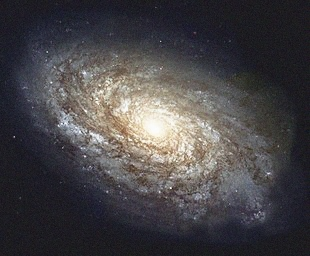

3    | 40              | 19.52 dB
[2341720255] Hasil Average 40 Citra:


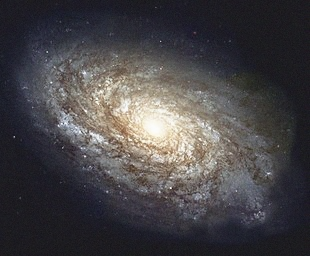

4    | 80              | 19.54 dB
[2341720255] Hasil Average 80 Citra:


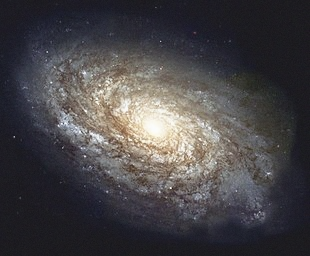

5    | 100             | 19.54 dB
[2341720255] Hasil Average 100 Citra:


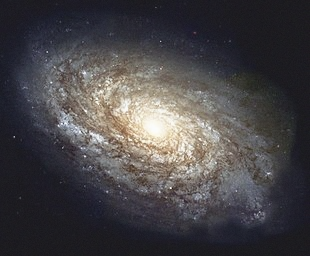

In [84]:
import cv2 as cv
import numpy as np
import glob
from math import log10, sqrt
from google.colab.patches import cv2_imshow

# 1. Fungsi hitung PSNR
#untuk menilai seberapa bersih gambar hasil olahan jika dibandingkan dengan gambar asli aslinya.
def PSNR(img1, img2):
  img1 = img1.astype(np.float64)
  img2 = img2.astype(np.float64)
  mse = np.mean((img1 - img2) ** 2)
  if mse == 0:
      return float('inf')
  return 20 * log10(255.0 / sqrt(mse))


# 2. Baca 100 citra noise
cv_img = []
for path in sorted(glob.glob('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/noises/*.jpg')):
    cv_img.append(cv.imread(path))

# 3. Baca citra original
original = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/noises/original/galaxy.jpg')
# Ambil tinggi (h) dan lebar (w) dari citra noise: (256, 310)
h, w = cv_img[0].shape[:2]
# Resize original ke (310, 256) agar shape-nya sama persis
original = cv.resize(original, (w, h))

# 4. Hitung rata-rata dan PSNR untuk 10, 20, 40, 80, dan 100 citra
jumlah_citra = [10, 20, 40, 80, 100]

print(f"{'No':<4} | {'Jumlah Citra':<15} | {'Nilai PSNR (dB)':<15}")
print("-" * 40)

for no, k in enumerate(jumlah_citra, 1):
    # Ambil k citra pertama, jumlahkan, lalu bagi dengan k
    rata_rata = np.mean(cv_img[:k], axis=0).astype(np.uint8)

    # Hitung PSNR terhadap citra asli
    skor_psnr = PSNR(original, rata_rata)

    # Cetak hasil ke tabel
    print(f"{no:<4} | {k:<15} | {skor_psnr:.2f} dB")

    # Tampilkan hasil gambar
    print(f"[{NIM}] Hasil Average {k} Citra:")
    cv2_imshow(rata_rata)

Apakah peningkatan jumlah citra selalu memberikan peningkatan PSNR yang signifikan?
Pada jumlah citra berapa peningkatan mulai tidak terlalu signifikan? Apa Kesimpulan yang
Anda peroleh dari percobaan ini?

Sesuai dengan hasil diatas , peningkatan nilai PSNR Tidak sellau memberikan peningkatan. PSNR sangat  tajam dan signifikan terjadi di 10 ke 20 dan saat ke 40. di citra 40 - 100 kenaikan PSNR semakin  kecil

**Kesimpulannya** adalah Operasi average denoising membuktikan bahwa merata-ratakan sekumpulan citra berderau efektif mereduksi derau Gaussian karena fluktuasi acak bernilai rata-rata nol ($\mu = 0$) akan saling meniadakan sementara informasi citra asli saling menguatkan, yang ditandai dengan meningkatnya skor PSNR (dB). Namun, kenaikan kualitas citra ini mengalami titik jenuh (diminishing returns) di mana lonjakan PSNR terjadi sangat signifikan pada rentang awal (10 hingga 40 citra), lalu mulai melambat dan mendatar pada kisaran 40 hingga 80 citra. Dengan demikian, penambahan citra di atas 80 hingga 100 lembar dinilai tidak lagi efisien secara komputasi karena beban pemrosesan dan memori meningkat pesat tanpa memberikan peningkatan ketajaman visual maupun kenaikan nilai dB yang berarti.

9. Buat mask biner Anda sendiri yang menutup area foto wajah dan area NIM pada
KTM1d.jpg, lalu gabungkan dengan citra menggunakan operator AND sehingga kedua
area tersebut tersamarkan.

Tinggi citra (h): 600
Lebar citra (w): 970


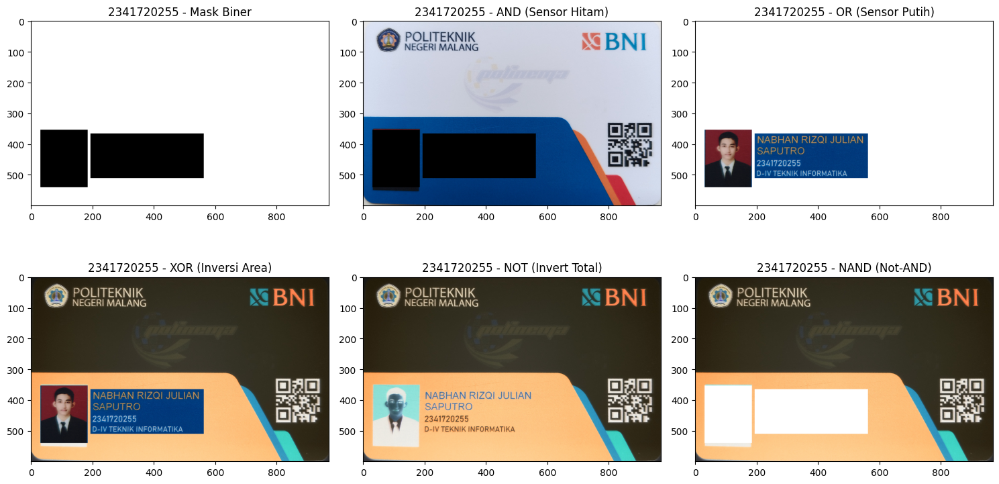

In [86]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca citra KTM1d
path = f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/KTM1d.jpg'
img = cv.imread(path)
# Resize images to 30% dari gambar asli agar tidak lama rendernya
img = cv.resize(img, (0, 0), fx=0.3, fy=0.3)
h, w = img.shape[:2]

# Check foto
print(f"Tinggi citra (h): {h}")
print(f"Lebar citra (w): {w}")
# plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
# plt.show()

# 2. Buat mask awal warna putih penuh (255)
mask = np.ones((h, w), dtype=np.uint8) * 255

# 3. Tentukan koordinat kotak hitam (0) untuk menyamarkan Wajah dan NIM
# Kotak 1: Sensor Wajah (x1, y1) ke (x2, y2)
#kira kira koordinat 1(30 , 360), 2(180, 540)
cv.rectangle(mask, (int(0.032*w), int(0.59*h)), (int(0.19*w), int(0.9*h)), 0, -1)

# Kotak 2: Sensor NIM (x1, y1) ke (x2, y2)
#kira kira koordinat 1(210 , 375), 2(540, 495)
cv.rectangle(mask, (int(0.2*w), int(0.61*h)), (int(0.58*w), int(0.85*h)), 0, -1)

# 4. Terapkan 5 operator logika sesuai tabel modul
# Mask perlu diubah ke 3 channel agar tipenya cocok saat operasi bitwise dengan citra berwarna
mask_3ch = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)

hasil_and  = cv.bitwise_and(img, mask_3ch)
hasil_or   = cv.bitwise_or(img, mask_3ch)
hasil_xor  = cv.bitwise_xor(img, mask_3ch)
hasil_not  = cv.bitwise_not(img)
hasil_nand = cv.bitwise_not(hasil_and)

# 5. Tampilkan semua hasil berdampingan
daftar_operasi = [
    ('Mask Biner', mask),
    ('AND (Sensor Hitam)', hasil_and),
    ('OR (Sensor Putih)', hasil_or),
    ('XOR (Inversi Area)', hasil_xor),
    ('NOT (Invert Total)', hasil_not),
    ('NAND (Not-AND)', hasil_nand)
]

plt.figure(figsize=(15, 8))
for idx, (nama_op, gbr) in enumerate(daftar_operasi, 1):
    plt.subplot(2, 3, idx)
    if len(gbr.shape) == 2:
        plt.imshow(gbr, cmap='gray')
    else:
        plt.imshow(cv.cvtColor(gbr, cv.COLOR_BGR2RGB))
    plt.title(f"{NIM} - {nama_op}")
    # plt.axis('off')

plt.tight_layout()
plt.show()

10. Carilah foto malam hari yang gelap. Namun, beberapa bagian gambar memiliki detail yang
sebenarnya cukup baik. Pilih salah satu metode berikut dan implementasikan pada foto
tersebut (Linear Brightness, Contrast, Logarithmic Brightness, Gamma Correction). Sebutkan
alasan dan resiko metode yang Anda gunakan.

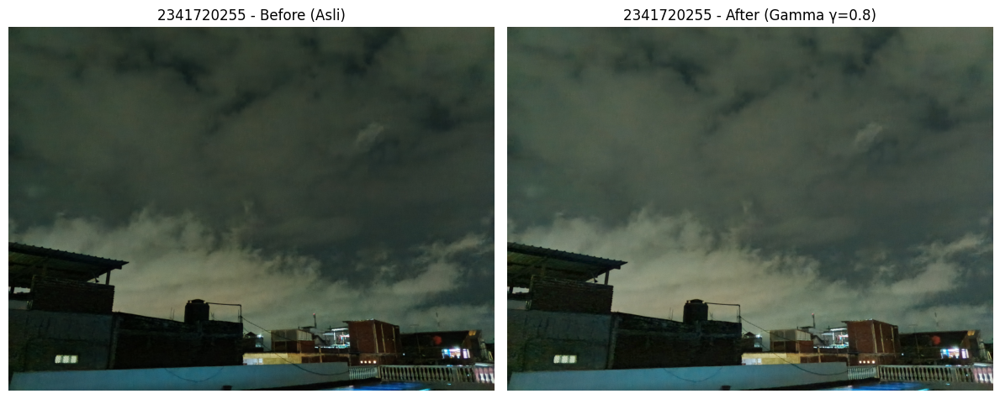

In [87]:
path = f'/content/drive/MyDrive/Kuliah/Semester5/PCVK/Img/NIGHT1.jpg'
img_bgr = cv.imread(path)
# Resize images to 30% dari gambar asli agar tidak lama rendernya
img_bgr = cv.resize(img_bgr, (0, 0), fx=0.3, fy=0.3)

img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)


# Menggunakan Gamma Correction (non-linier)
# Nilai gamma < 1 untuk mencerahkan
gamma_pilihan = 0.8
hasil_gamma = np.array(255 * (img_rgb / 255.0) ** gamma_pilihan, dtype=np.uint8)

# Tampilkan Before-After berdampingan
plt.figure(figsize=(12, 5))

# Before
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title(f"{NIM} - Before (Asli)")
plt.axis('off')

# After
plt.subplot(1, 2, 2)
plt.imshow(hasil_gamma)
plt.title(f"{NIM} - After (Gamma γ={gamma_pilihan})")
plt.axis('off')

plt.tight_layout()
plt.show()

1. Metode yangg dipilih: Gamma Correction dengan nilai gamma = 0.8 , sesuai dengan pemandangaan malam yang tidak terlalu gelap dan menghasilkan gambar yang tidak terlalu terang

2. Alasan  memilih karena menggunakan citra malam yang gelap dan sedikit cahaya.

3. Menggunakan parameter 0.8 karena sesuai dengan pemandangaan malam yang tidak terlalu gelap dan menghasilkan gambar yang tidak terlalu terang

4. Resiko metode ini adalah menggunakan paramter yang terlalu kecil mendekati 0 , yang  menyebabkan citra menjadi  abu abu terang